In [1]:
# conda activate bio

# Data manipulation 
import pandas as pd 
import numpy as np
from evcouplings.align import Alignment, map_matrix

# Data viz
import matplotlib.pyplot as plt 
import seaborn as sns
from distinctipy import distinctipy
import plotly.express as px
from brokenaxes import brokenaxes

# load data and plot functions

In [2]:
! ls ../results/dim_redo/splitted_classes/tsne/

all_plm_mbl.csv			     tsne_2d_perptest_mbl_350_esm1b.csv
all_plm_sbl.csv			     tsne_2d_perptest_mbl_400_esm1b.csv
tsne_2d_clust90_mbl_esm1b.csv	     tsne_2d_perptest_mbl_56_esm1b.csv
tsne_2d_clust90_sbl_esm1b.csv	     tsne_2d_perptest_mbl_5_esm1b.csv
tsne_2d_fulldset_mbl_esm1b.csv	     tsne_2d_perptest_sbl_100_esm1b.csv
tsne_2d_fulldset_sbl_esm1b.csv	     tsne_2d_perptest_sbl_151_esm1b.csv
tsne_2d_itertest_mbl_1000_esm1b.csv  tsne_2d_perptest_sbl_200_esm1b.csv
tsne_2d_itertest_mbl_1500_esm1b.csv  tsne_2d_perptest_sbl_227_esm1b.csv
tsne_2d_itertest_mbl_2000_esm1b.csv  tsne_2d_perptest_sbl_250_esm1b.csv
tsne_2d_itertest_mbl_2500_esm1b.csv  tsne_2d_perptest_sbl_300_esm1b.csv
tsne_2d_itertest_mbl_3000_esm1b.csv  tsne_2d_perptest_sbl_350_esm1b.csv
tsne_2d_itertest_mbl_3500_esm1b.csv  tsne_2d_perptest_sbl_400_esm1b.csv
tsne_2d_itertest_mbl_4000_esm1b.csv  tsne_2d_perptest_sbl_50_esm1b.csv
tsne_2d_itertest_mbl_500_esm1b.csv   tsne_2d_perptest_sbl_5_esm1b.csv
tsne_2d_itertest_sbl_1000_esm1b.

In [3]:
# load seqs annots
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

# load likelihoods from carp and merge dset
df_plm = pd.read_pickle("../results/embeddings/all_plm.pkl")
df_plm = df_plm[["seq_id", "carp640M_logp"]]
df_annot_plm = pd.merge(df_annot, df_plm, on = "seq_id")

# load tsne coords and merge annots
df_sbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_sbl_esm1b.csv")
df_sbl = df_sbl.merge(df_annot_plm, on = "seq_id")
df_sbl_a = df_sbl[df_sbl.bla_class == "Class A"]
df_sbl_c = df_sbl[df_sbl.bla_class == "Class C"]
df_sbl_d = df_sbl[df_sbl.bla_class == "Class D"]
df_mbl = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_plm_mbl_esm1b.csv")
df_mbl = df_mbl.merge(df_annot_plm, on = "seq_id")

# load per class dsets and merge annots
# note: df_b and df_mbl are exactly the same dset 
# protein_family_header col was removed to avoid col duplication in the merged dset
df_a = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_A_esm1b.csv")
df_c = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_C_esm1b.csv")
df_d = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_D_esm1b.csv")
df_b = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_perclass_Class_B_esm1b.csv")
del df_a["protein_family_header"]
del df_c["protein_family_header"]
del df_d["protein_family_header"]
del df_b["protein_family_header"]
df_a = df_a.merge(df_annot_plm, on = "seq_id")
df_c = df_c.merge(df_annot_plm, on = "seq_id")
df_d = df_d.merge(df_annot_plm, on = "seq_id")
df_b = df_b.merge(df_annot_plm, on = "seq_id")

# load and merge representative dsets
df_sbl90 = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_clust90_sbl_esm1b.csv")
df_mbl90 = pd.read_csv("../results/dim_redo/splitted_classes/tsne/tsne_2d_clust90_mbl_esm1b.csv")
df_sbl90 = df_sbl90.merge(df_annot, on = "seq_id")
df_mbl90 = df_mbl90.merge(df_annot, on = "seq_id")

In [4]:
np.round(df_a[df_a.protein_family_header == "SHV"].describe(), 2)

,tSNE1_esm1b,tSNE2_esm1b,length,molecular_weight,aromaticity,instability,gravy,isoelectric_point,entropy,helix,turn,sheet,bitscore,Other_sigpept,SP(Sec/SPI),LIPO(Sec/SPII),TAT(Tat/SPI),TATLIPO(Sec/SPII),PILIN(Sec/SPIII),carp640M_logp
count,363.00,363.00,363.00,362.00,362.00,362.00,362.00,362.00,362.00,362.00,362.00,362.00,363.00,363.00,363.00,363.00,363.0,363.0,363.0,363.00
mean,23.00,-28.98,281.42,30715.23,0.05,39.20,-0.07,7.87,4.02,0.28,0.20,0.34,540.30,0.05,0.94,0.00,0.0,0.0,0.0,-0.23
std,2.75,1.39,18.47,2038.97,0.00,1.91,0.03,0.73,0.01,0.00,0.00,0.00,36.08,0.22,0.22,0.03,0.0,0.0,0.0,0.02
min,10.64,-30.88,95.00,10298.79,0.04,31.65,-0.27,5.72,3.84,0.26,0.19,0.31,183.00,0.00,0.00,0.00,0.0,0.0,0.0,-0.31
25%,23.04,-29.78,286.00,31186.09,0.05,37.60,-0.08,7.76,4.02,0.28,0.20,0.33,548.00,0.00,1.00,0.00,0.0,0.0,0.0,-0.23
50%,23.60,-29.34,286.00,31234.62,0.05,38.97,-0.06,7.76,4.02,0.29,0.20,0.34,550.00,0.00,1.00,0.00,0.0,0.0,0.0,-0.22
75%,24.25,-28.57,286.00,31266.41,0.05,40.52,-0.05,8.48,4.02,0.29,0.20,0.34,552.00,0.00,1.00,0.00,0.0,0.0,0.0,-0.21
max,26.35,-23.31,332.00,35741.76,0.06,44.32,0.04,11.12,4.03,0.29,0.22,0.35,555.00,1.00,1.00,0.50,0.0,0.0,0.0,-0.20


In [10]:
def do_iscatter(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 800, width = 900, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = [
        "protein_family_header", "length", 'bla_class'])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()
    
df_sbl.columns

Index(['tSNE1_esm1b', 'tSNE2_esm1b', 'seq_id', '#name', 'seq', 'length',
       'filename', 'protein_name', 'protein_family', 'bla_class',
       'bla_subclass', 'protein_family_header', 'molecular_weight',
       'aromaticity', 'instability', 'gravy', 'isoelectric_point', 'entropy',
       'helix', 'turn', 'sheet', 'is_clust90_rep', 'bitscore', 'Domain',
       'Phylum', 'Class', 'Order', 'Family', 'Genus', 'Species',
       'predicted_signal_peptide', 'Other_sigpept', 'SP(Sec/SPI)',
       'LIPO(Sec/SPII)', 'TAT(Tat/SPI)', 'TATLIPO(Sec/SPII)',
       'PILIN(Sec/SPIII)', 'CS Position', 'seq_without_sigpept',
       'carp640M_logp'],
      dtype='object')

In [11]:
#quick viz 
do_iscatter(df_sbl_a[df_sbl_a.protein_family_header != "Other"], "protein_family_header")

In [7]:
print(f"uniq fams a: {df_sbl_a.protein_family_header.nunique()}")
print(f"uniq fams b: {df_b.protein_family_header.nunique()}")
print(f"uniq fams c: {df_sbl_c.protein_family_header.nunique()}")
print(f"uniq fams d: {df_sbl_d.protein_family_header.nunique()}")

uniq fams a: 119
uniq fams b: 101
uniq fams c: 51
uniq fams d: 20


In [8]:
col_a = distinctipy.get_colors(119, pastel_factor=0)
hex_a = []
for color in col_a:
    hex_a.append(distinctipy.get_hex(color))
    
col_b = distinctipy.get_colors(101, pastel_factor=0)
hex_b = []
for color in col_b:
    hex_b.append(distinctipy.get_hex(color))
    
col_c = distinctipy.get_colors(51, pastel_factor=0)
hex_c = []
for color in col_c:
    hex_c.append(distinctipy.get_hex(color))
    
col_d = distinctipy.get_colors(20, pastel_factor=0)
hex_d = []
for color in col_d:
    hex_d.append(distinctipy.get_hex(color))

In [9]:
#quick viz 
def do_iscatter_a(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
    
    hex_a[3] = "#FFFFFF"

    
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 750, width = 850, color = annot,
    hover_name = annot, opacity=1, color_discrete_sequence = hex_a,
    hover_data = ["protein_family_header", "protein_name", "length"])

    fig.update_traces(marker=dict(size=10, line=dict(width=1,color="black")),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    
    white_marker_style = {'marker': {'opacity': 0.1}}
    for i, color in enumerate(hex_a):
        if color == "#FFFFFF":
            fig.update_traces(white_marker_style, selector=dict(marker_color=color))
    
    # fig.update_layout(plot_bgcolor='black')
    
    fig.show() 

do_iscatter_a(df_sbl_a, "protein_family_header")

In [12]:
do_iscatter_a(df_sbl_a, "Phylum")

In [13]:
#quick viz 
def do_iscatter_b(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
    
    hex_b[0] = "#FFFFFF"

    
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 750, width = 850, color = annot,
    hover_name = annot, opacity=1, color_discrete_sequence = hex_b,
    hover_data = ["protein_family_header", "protein_name"])

    fig.update_traces(marker=dict(size=10, line=dict(width=1,color="black")),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    
    white_marker_style = {'marker': {'opacity': 0.1}}
    for i, color in enumerate(hex_b):
        if color == "#FFFFFF":
            fig.update_traces(white_marker_style, selector=dict(marker_color=color))
    
    # fig.update_layout(plot_bgcolor='black')
    
    fig.show() 


do_iscatter_b(df_b, "protein_family_header")

In [14]:
do_iscatter_b(df_b[df_b.bla_subclass.str.contains("Class B1|Class B2")], "protein_family_header")

In [15]:
do_iscatter_b(df_b[df_b.bla_subclass.str.contains("Class B3")], "protein_family_header")

In [16]:
#quick viz 
def do_iscatter_c(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
    
    hex_c[1] = "#FFFFFF"

    
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 750, width = 850, color = annot,
    hover_name = annot, opacity=1, color_discrete_sequence = hex_c,
    hover_data = ["protein_family_header", '#name', "protein_name"])

    fig.update_traces(marker=dict(size=10, line=dict(width=1,color="black")),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    
    white_marker_style = {'marker': {'opacity': 0.1}}
    for i, color in enumerate(hex_c):
        if color == "#FFFFFF":
            fig.update_traces(white_marker_style, selector=dict(marker_color=color))
    
    # fig.update_layout(plot_bgcolor='black')
    
    fig.show() 

do_iscatter_c(df_sbl_c, "protein_family_header")

In [18]:
#quick viz 
def do_iscatter_d(df, annot):
    
    """
    do a scatterplot given a df and hue
    """
    
    hex_d[16] = "#FFFFFF"

    
    # plot
    fig = px.scatter(
    df, x = 'tSNE1_esm1b', y = 'tSNE2_esm1b',
    height = 750, width = 850, color = annot,
    hover_name = annot, opacity=1, color_discrete_sequence = hex_d,
    hover_data = ["protein_family_header",  "protein_name"])

    fig.update_traces(marker=dict(size=10, line=dict(width=1,color="black")),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    
    white_marker_style = {'marker': {'opacity': 0.1}}
    for i, color in enumerate(hex_d):
        if color == "#FFFFFF":
            fig.update_traces(white_marker_style, selector=dict(marker_color=color))
    
    # fig.update_layout(plot_bgcolor='black')
    
    fig.show() 


do_iscatter_d(df_sbl_d, "protein_family_header")

# ancestral neighborhood

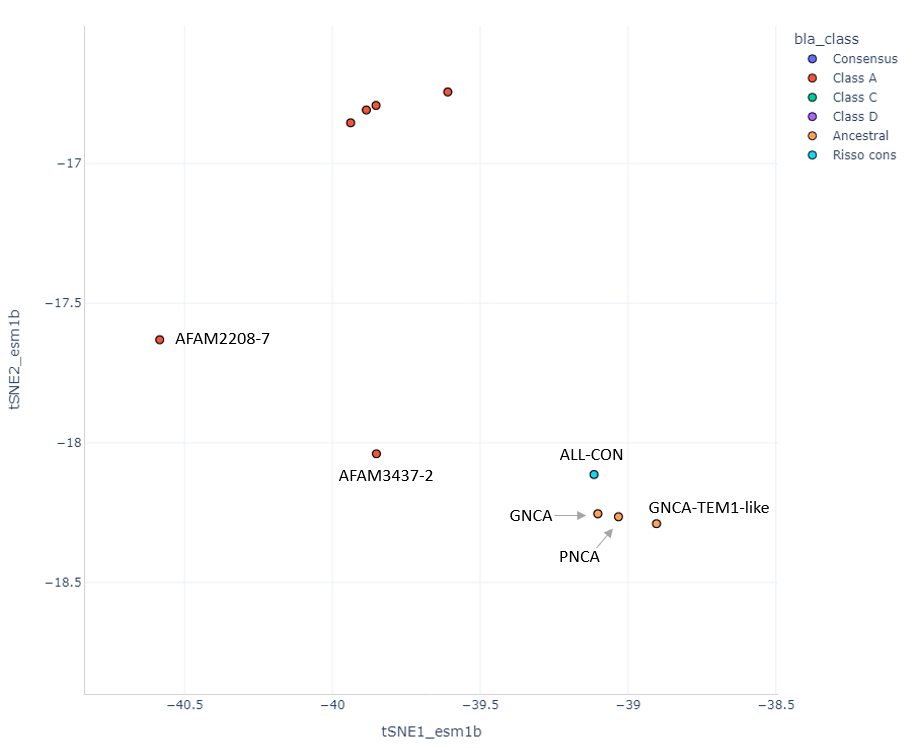

In [19]:
df_neighbor = df_sbl[df_sbl.protein_name.str.contains("ENCA|GNCA|GNCA-TEM-1-like|PNCA|ALL-CON|AFAM2208-7|AFAM3437-2")]
# df_neighbor[["protein_name", "seq"]].to_csv("/home/gama/desktop/df_neighbor.csv", index = False, sep  = "\t")
df_neighbor

,tSNE1_esm1b,tSNE2_esm1b,seq_id,#name,seq,length,filename,protein_name,protein_family,bla_class,...,predicted_signal_peptide,Other_sigpept,SP(Sec/SPI),LIPO(Sec/SPII),TAT(Tat/SPI),TATLIPO(Sec/SPII),PILIN(Sec/SPIII),CS Position,seq_without_sigpept,carp640M_logp
2292,-40.583897,-17.630640,seq_2289,AIN57747.1|AFAM2208-7| beta-lactamase [Pseudom...,MRKALQQLEATTGSTIGLWALDTGSGQQLAWRAEERFAFCSTFKAI...,261,A-AFAM2208-7-prot.fasta,AFAM2208-7,AFAM2208,Class A,...,NO_SP,1.000003,0.0,0.000000,0.000000,0.000000,0.0,NaN,MRKALQQLEATTGSTIGLWALDTGSGQQLAWRAEERFAFCSTFKAI...,-0.211986
3491,-39.851078,-18.039162,seq_3488,WP_082568430.1|AFAM3437-2| class A beta-lactamase,MDRRLFNAMLAAALTGCGTAATARKNWGVSPEWARLETSVGGRLGV...,288,A-AFAM3437-2-prot.fasta,AFAM3437-2,AFAM3437,Class A,...,TATLIPO,0.000000,0.0,0.166051,0.331562,0.502375,0.0,CS pos: 16-17. Pr: 0.4405,CGTAATARKNWGVSPEWARLETSVGGRLGVAVLDTATGHCSGHRVD...,-0.323472
22682,-0.270373,-30.434637,seq_25816,ENCA,MHPQTLEQIKESESQLSGRVGMVELDLASGRTLSYRADERFPMMST...,263,ENCA,ENCA,Ancestral,Ancestral,...,NO_SP,1.000003,0.0,0.000000,0.000000,0.000000,0.0,NaN,MHPQTLEQIKESESQLSGRVGMVELDLASGRTLSYRADERFPMMST...,-0.195557
22683,-39.102330,-18.253770,seq_25817,GNCA,AAQLSEQLAELEKRSGGRLGVAVLDTATGRRIAYRGDERFPMCSTF...,262,GNCA,GNCA,Ancestral,Ancestral,...,NO_SP,1.000019,0.0,0.000000,0.000000,0.000000,0.0,NaN,AAQLSEQLAELEKRSGGRLGVAVLDTATGRRIAYRGDERFPMCSTF...,-0.105173
22684,-38.903748,-18.289371,seq_25818,GNCA-TEM-1-like,MAAQLSEQLAELEKRSGGRVGVIVLDTATGRRIAYRGDERFPMMST...,269,GNCA-TEM-1-like,GNCA-TEM-1-like,Ancestral,Ancestral,...,NO_SP,0.999994,0.0,0.000000,0.000000,0.000000,0.0,NaN,MAAQLSEQLAELEKRSGGRVGVIVLDTATGRRIAYRGDERFPMMST...,-0.170116
22685,-39.032295,-18.264486,seq_25819,PNCA,AAALSEQLAELEKRSGGRLGVAVLDTATGRRIAYRGDERFPMCSTF...,262,PNCA,PNCA,Ancestral,Ancestral,...,NO_SP,1.000009,0.0,0.000000,0.000000,0.000000,0.0,NaN,AAALSEQLAELEKRSGGRLGVAVLDTATGRRIAYRGDERFPMCSTF...,-0.107354
22686,-39.115190,-18.113527,seq_25820,ALL-CON,AAALNDEFAALEKQYGGRLGVYALDTGTGRTIAYRADERFPMCSTF...,262,ALL-CON,ALL-CON,Risso cons,Risso cons,...,NO_SP,1.000011,0.0,0.000000,0.000000,0.000000,0.0,NaN,AAALNDEFAALEKQYGGRLGVYALDTGTGRTIAYRADERFPMCSTF...,-0.098581


```bash
# convert to fasta and remove col headers 
seqkit tab2fx df_neighbor.csv > class_a_neighbors.fasta

# send to MAFFT MPIbio webserver https://toolkit.tuebingen.mpg.de/tools/mafft
# and download the msa in fasta format 

# trim gaps 
alignbuddy msa_class_a_neighbors.fasta --trimal gappyout > msa_class_a_neighbors_gappyout.fasta 
 

```

In [20]:
# do msa and clean it as in notebook 1
! ls ../results/ancestral_neighborhood/

class_a_neighbors.fasta  msa_class_a_neighbors.fasta	       old_try
df_neighbor.csv		 msa_class_a_neighbors_gappyout.fasta


alignment is of length 397 and has 10 sequences
Minimum sequence identity detected for msa_class_c_families_cefoxitin.fasta: 0.3602015113350126 



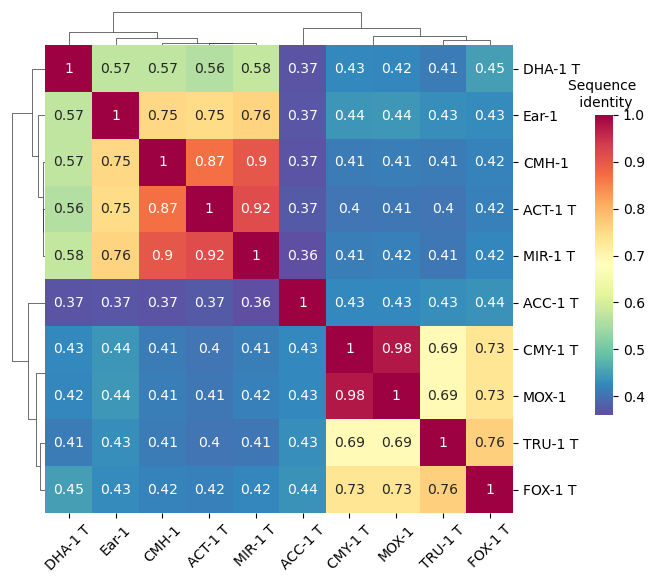

In [21]:
def do_ident_mat2(path, msa, title):
    
    """
    plot a identity matrix given a MSA
    """
    
    # Read in a sequence alignment from a fasta file
    msa_input = path + msa
    with open(msa_input, "r") as infile:
        aln = Alignment.from_file(infile, format="fasta")
    
    # Sequence length and number of sequences
    print(f"alignment is of length {aln.L} and has {aln.N} sequences")
    
    # calculate the percent identity of every sequence in the alignment to the first sequence
    aln.identities_to(aln.matrix[0])
    
    identity_matrix = np.zeros((aln.N, aln.N))
    identity_matrix.fill(np.nan)
    
    #loop through each sequence
    for idx in range(identity_matrix.shape[0]):
    
        #calculate all the percent identitites to that sequence
        idents = aln.identities_to(aln.matrix[idx,:])
        identity_matrix[idx] = idents
    
    # plot
    print(f"Minimum sequence identity detected for {msa}: {identity_matrix.min()} \n")
    g = sns.clustermap(identity_matrix, yticklabels=aln.ids, xticklabels=aln.ids, cmap = "Spectral_r",
                   dendrogram_ratio=(.07, .07), figsize = (6,6), annot = True, method= "ward", metric = "euclidean",
                   cbar_pos=(1, 0.3, 0.03, 0.5), cbar_kws={"orientation": "vertical"})
    plt.title("Sequence \n identity", size = 10)
    plt.setp(g.ax_heatmap.get_xticklabels(), rotation=45)
    
do_ident_mat2("/home/gama/desktop/antibioticos/", "msa_class_c_families_cefoxitin.fasta", "Class C")

In [22]:
def do_ident_mat(msa, title):
    
    """
    plot a identity matrix given a MSA
    """
    
    # Read in a sequence alignment from a fasta file
    msa_input = "../results/ancestral_neighborhood/" + msa
    with open(msa_input, "r") as infile:
        aln = Alignment.from_file(infile, format="fasta")
    
    # Sequence length and number of sequences
    print(f"alignment is of length {aln.L} and has {aln.N} sequences")
    
    # calculate the percent identity of every sequence in the alignment to the first sequence
    aln.identities_to(aln.matrix[0])
    
    identity_matrix = np.zeros((aln.N, aln.N))
    identity_matrix.fill(np.nan)
    
    #loop through each sequence
    for idx in range(identity_matrix.shape[0]):
    
        #calculate all the percent identitites to that sequence
        idents = aln.identities_to(aln.matrix[idx,:])
        identity_matrix[idx] = idents
    
    # plot
    print(f"Minimum sequence identity detected for {msa}: {identity_matrix.min()} \n")
    g = sns.clustermap(identity_matrix, yticklabels=aln.ids, xticklabels=aln.ids, cmap = "cividis",
                   dendrogram_ratio=(.07, .07), figsize = (6,6), annot = True, method= "ward", metric = "euclidean",
                   cbar_pos=(1, 0.3, 0.03, 0.5), cbar_kws={"orientation": "vertical"})
    plt.title("Sequence \n identity", size = 10)
    plt.setp(g.ax_heatmap.get_xticklabels(), rotation=25)

alignment is of length 262 and has 7 sequences
Minimum sequence identity detected for msa_class_a_neighbors_gappyout.fasta: 0.42748091603053434 



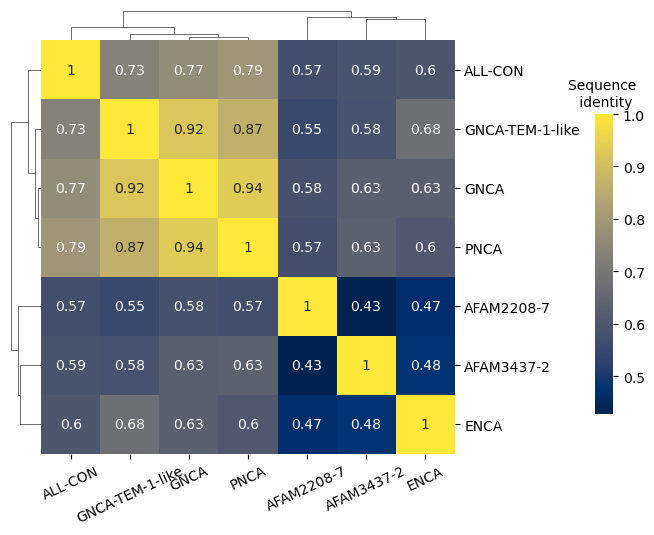

In [23]:
do_ident_mat("msa_class_a_neighbors_gappyout.fasta", "ancestral neighborhood")

# protein fam

In [24]:
for ele in df_sbl.bla_class.unique():
    unique_fams = df_sbl[df_sbl.bla_class.str.contains(ele)].protein_family_header.unique()
    print(f"################################### {ele} ##################################")
    print(f"Number of unique protein families in {ele}: {len(unique_fams)}")
    print(f"{unique_fams} \n ")

################################### Consensus ##################################
Number of unique protein families in Consensus: 1
['Consensus'] 
 
################################### Class A ##################################
Number of unique protein families in Class A: 119
['ACI' 'AER' 'AFA' 'Other' 'ARL' 'AST' 'ASU1' 'AXC' 'BBI' 'BCL' 'BEL'
 'BES' 'BIC' 'BKC' 'BOR' 'BPS' 'BRO' 'BcI' 'BcIII' 'BlaA' 'BlaS' 'CAD'
 'CARB' 'CBP' 'CGA' 'CIA' 'CKA' 'CKO' 'CM1' 'CME' 'CPA' 'CRH' 'CRP' 'CST'
 'CTX-M' 'CblA' 'CdiA' 'CepA' 'CfxA' 'CzoA' 'DBA' 'DES' 'ERP' 'FAR' 'FEC'
 'FLC' 'FONA' 'FPH' 'FRI' 'FTU' 'GES' 'GIL' 'GPA' 'GPC' 'HMS' 'HugA' 'IMI'
 'KLUA' 'KLUC' 'KLUG' 'KLUY' 'KPC' 'L2' 'LAP' 'LEN' 'LUS' 'LUT' 'MAB'
 'MAL' 'MIA' 'MIN' 'MM3' 'MP' 'OHIO' 'OIH' 'OKP' 'ORF6' 'ORN' 'OXY' 'PAD'
 'PAL' 'PAU' 'PC1' 'PC2' 'PER' 'PLA' 'PLES' 'PME' 'PSV' 'PbbA' 'PenA'
 'PenB' 'PenE' 'PenP' 'R39' 'RAA' 'RAHN' 'RCP' 'RIC' 'ROB' 'RPA' 'RSA1'
 'RSA2' 'RUB' 'SCO' 'SDA' 'SED' 'SFC' 'SFO' 'SGM' 'SHV' 'SME' 'TEM' 'TER'

In [25]:
for ele in df_mbl.bla_subclass.unique():
    unique_fams = df_mbl[df_mbl.bla_subclass.str.contains(ele)].protein_family_header.unique()
    print(f"################################### {ele} ##################################")
    print(f"Number of unique protein families in {ele}: {len(unique_fams)}")
    print(f"{unique_fams} \n ")

################################### Consensus ##################################
Number of unique protein families in Consensus: 1
['Consensus'] 
 
################################### Class B1 ##################################
Number of unique protein families in Class B1: 53
['Other' 'AFM' 'ANA' 'BIM' 'BcII' 'BlaB' 'CAM' 'CGB' 'CX1' 'CfiA' 'DIM'
 'EBR' 'ECV' 'ElBla2' 'FIA' 'FIM' 'GIM' 'GMB' 'GRD23' 'HBA' 'HMB' 'IMP'
 'IND' 'JOHN' 'KHM' 'MOC' 'MUS' 'MYO' 'MYX' 'NDM' 'ORR' 'PAN' 'PEDO' 'PKB'
 'PST' 'SFB' 'SHD' 'SHN' 'SIM' 'SLB' 'SPM' 'SPN79' 'SPS' 'STA' 'TMB' 'TTU'
 'TUS' 'VAM' 'VIM' 'VMB' 'VMH' 'ZHO' 'ZOG'] 
 
################################### Class B2 ##################################
Number of unique protein families in Class B2: 6
['Other' 'CVI' 'CphA' 'PFM' 'SFH' 'YEM'] 
 
################################### Class B3 ##################################
Number of unique protein families in Class B3: 45
['Other' 'AIM' 'ALG11' 'ALG6' 'AM1' 'B3SU1' 'B3SU2' 'BJP' 'CAR' 'CAU'
 'CHI' '

In [26]:
# this is the number of fams retrived directly from the filename, 
# but include non recognized fams by BLDB. i.e. AFAM seqs and others
for ele in df_sbl.bla_class.unique():
    unique_fams_all = df_sbl[df_sbl.bla_class.str.contains(ele)].protein_family.unique()
    print(f"################################### {ele} ##################################")
    print(f"Number of unique protein families in {ele}: {len(unique_fams_all)} \n")

################################### Consensus ##################################
Number of unique protein families in Consensus: 1 

################################### Class A ##################################
Number of unique protein families in Class A: 3054 

################################### Class C ##################################
Number of unique protein families in Class C: 416 

################################### Class D ##################################
Number of unique protein families in Class D: 29 

################################### Ancestral ##################################
Number of unique protein families in Ancestral: 1 

################################### Risso cons ##################################
Number of unique protein families in Risso cons: 1 



In [27]:
for ele in df_mbl.bla_subclass.unique():
    unique_fams_all = df_mbl[df_mbl.bla_subclass.str.contains(ele)].protein_family.unique()
    print(f"################################### {ele} ##################################")
    print(f"Number of unique protein families in {ele}: {len(unique_fams_all)} \n")

################################### Consensus ##################################
Number of unique protein families in Consensus: 1 

################################### Class B1 ##################################
Number of unique protein families in Class B1: 403 

################################### Class B2 ##################################
Number of unique protein families in Class B2: 10 

################################### Class B3 ##################################
Number of unique protein families in Class B3: 590 



In [28]:
# Define color palletes for bla_class
colors_class_a = distinctipy.get_colors(119, pastel_factor=0) 
colors_class_b = distinctipy.get_colors(101, pastel_factor=0) 
colors_class_c = distinctipy.get_colors(51, pastel_factor=0) 
colors_class_d = distinctipy.get_colors(20, pastel_factor=0) 

# change color of "other" category to light gray
colors_class_a[0] = (0.85,0.85,0.85)
colors_class_b[0] = (0.85,0.85,0.85)
colors_class_c[1] = (0.85,0.85,0.85)
colors_class_d[1] = (0.85,0.85,0.85)


def do_scatter_plt(df, title, palette, cols):
    plt.figure(figsize=(6,6))
    ax = sns.scatterplot(
        data = df.sort_values(by="protein_family_header", key=lambda x: x.map(x.value_counts()), ascending=False), 
        x="tSNE1_esm1b", y="tSNE2_esm1b", alpha = 0.7,
        hue="protein_family_header", 
        palette=palette, edgecolor="none")
    # plt.legend(ncol=4, bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.title(title)
    
    h, l = ax.get_legend_handles_labels()
    counts = df["protein_family_header"].value_counts().reindex(l)
    l = [f'{yn} ({c})' for yn,c in counts.iteritems()]
    ax.legend(h,l, title="Family", loc='center left', bbox_to_anchor=(1, 0.5), ncol = cols)

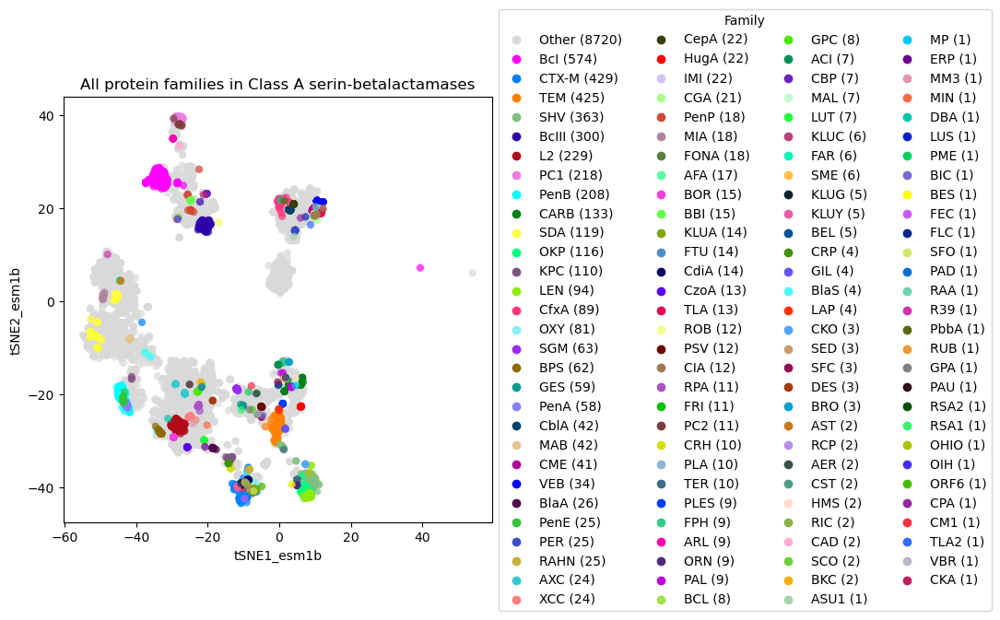

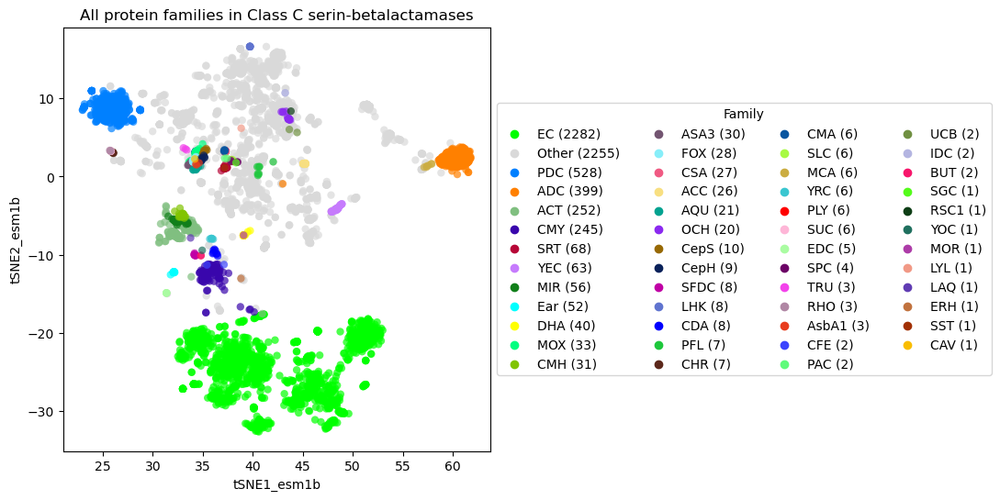

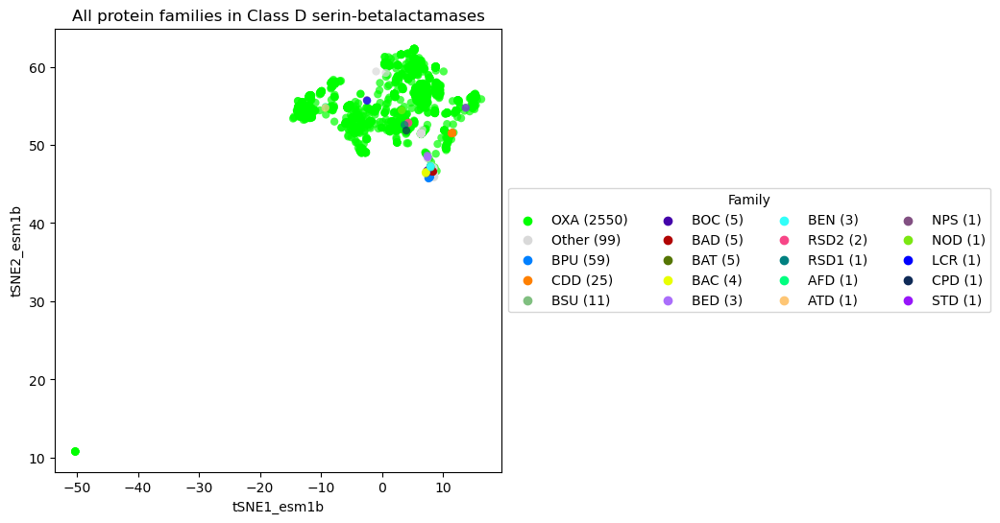

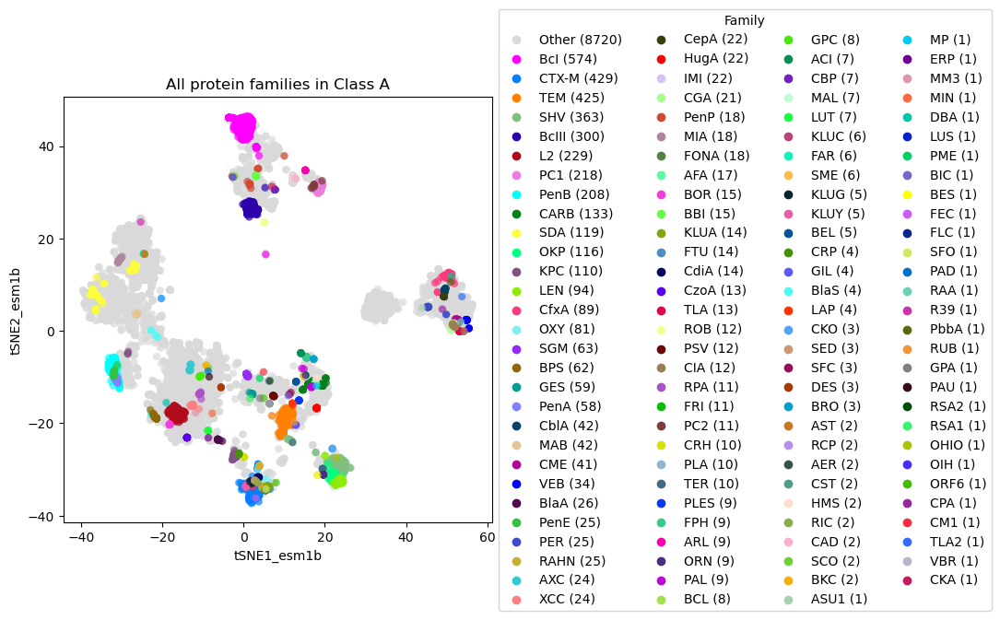

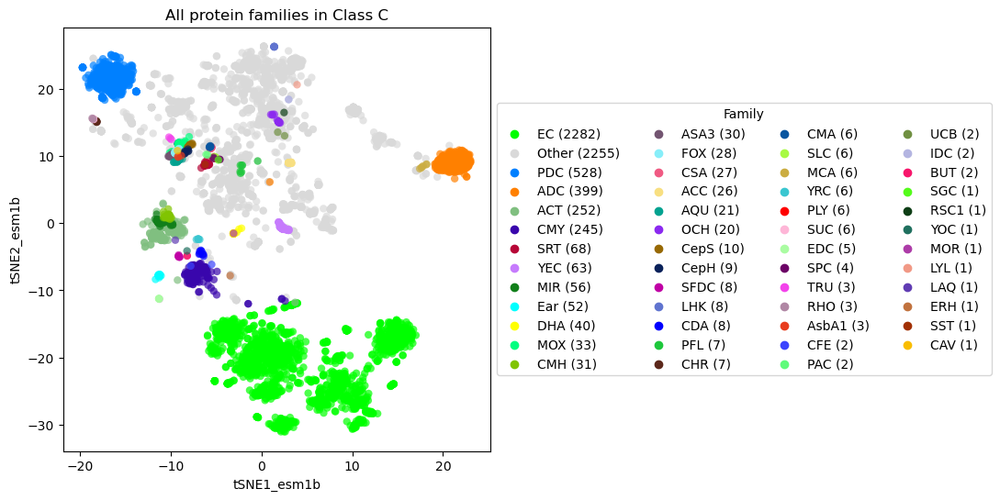

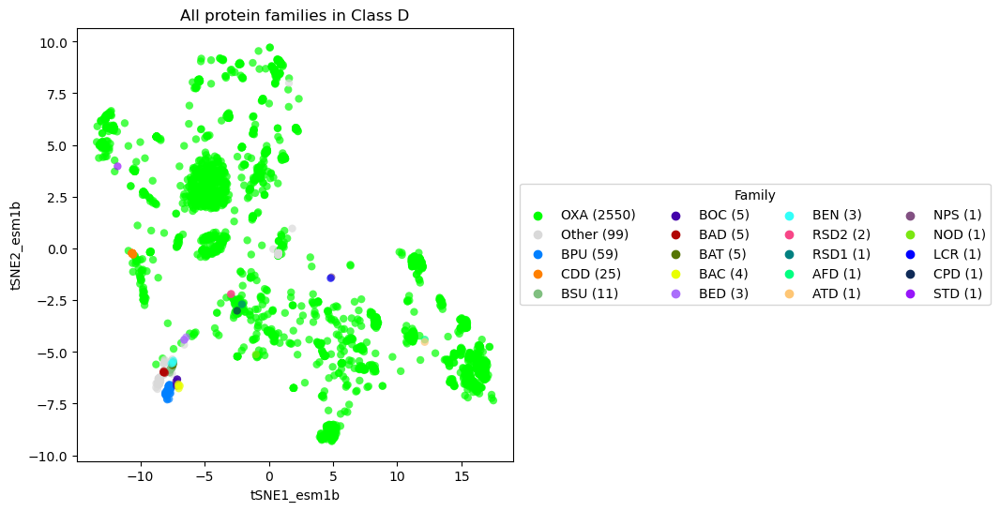

In [29]:
# check sbl dset
do_scatter_plt(df_sbl_a, "All protein families in Class A serin-betalactamases", colors_class_a, 4)
do_scatter_plt(df_sbl_c, "All protein families in Class C serin-betalactamases", colors_class_c, 4)
do_scatter_plt(df_sbl_d, "All protein families in Class D serin-betalactamases", colors_class_d, 4)

# check single dset
do_scatter_plt(df_a, "All protein families in Class A", colors_class_a, 4)
do_scatter_plt(df_c, "All protein families in Class C", colors_class_c, 4)
do_scatter_plt(df_d, "All protein families in Class D", colors_class_d, 4)

/tmp/ipykernel_611/1482000597.py:16: UserWarning:


The palette list has fewer values (101) than needed (102) and will cycle, which may produce an uninterpretable plot.



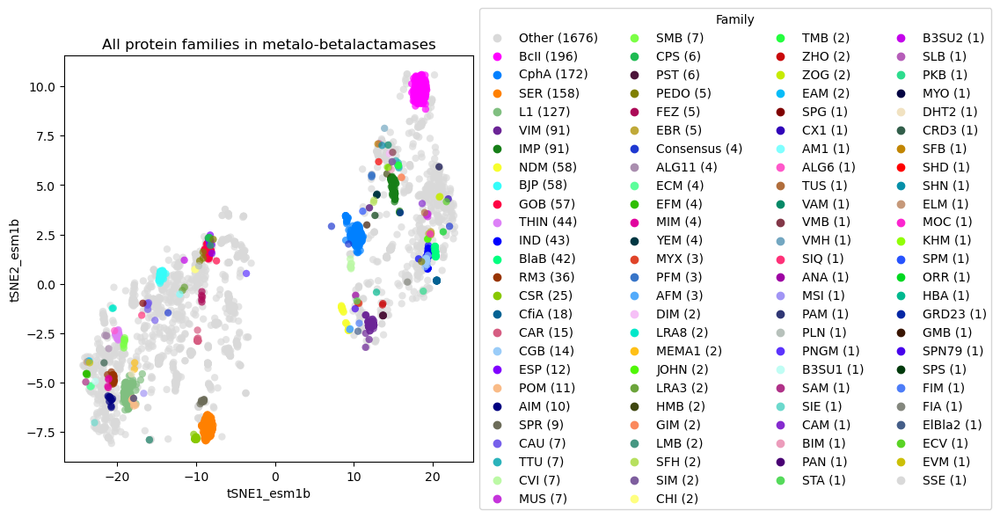

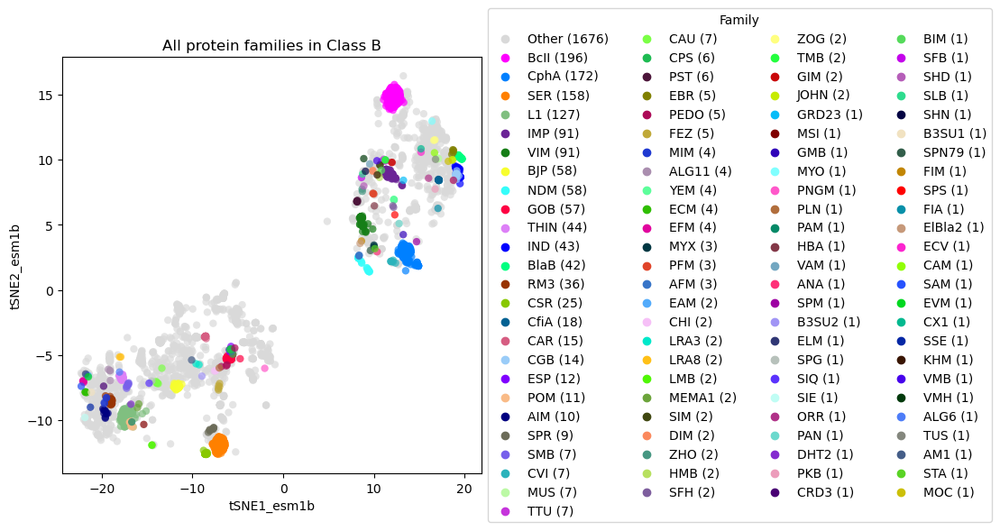

In [30]:
do_scatter_plt(df_mbl, "All protein families in metalo-betalactamases", colors_class_b, 4)
do_scatter_plt(df_b, "All protein families in Class B", colors_class_b, 4)

In [31]:
def fam_count_plot(df, bla_class):
    
    fams = df.groupby("protein_family_header").count().iloc[:,[0]]
    fams = fams.reset_index()
    fams = fams.rename(columns={"protein_family_header": "family", "tSNE1_esm1b":"number"})
    fams = fams.sort_values("number", ascending=False)
    fams_counts = fams.groupby("number").count().reset_index()
    fams_top20 = fams.head(20)
    
    # plot
    fig = plt.figure(figsize=(14, 6))
    # with fam names
    ax1 = fig.add_subplot(121)
    ax = sns.barplot(fams_top20, x = "number", y = "family", color = "salmon")
    plt.xlabel("Number of sequences in the family")
    plt.xticks(rotation = 90)
    plt.ylabel("")
    plt.xticks(rotation = 0)
    ax1.set_title("Top20 most abundant protein families")
    ax.bar_label(ax.containers[0], size=8)
    
    # with fam frecuency 
    ax2 = fig.add_subplot(122)
    ax = sns.barplot(fams_counts, x = "number", y = "family", color = "cornflowerblue")
    plt.xlabel("Number of sequences in the family")
    plt.ylabel("Frecuency")
    plt.xticks(rotation = 90)
    ax2.set_title("Frecuency for all protein families")
    ax.bar_label(ax.containers[0], size=10)
    
    plt.suptitle(bla_class)
    plt.tight_layout()

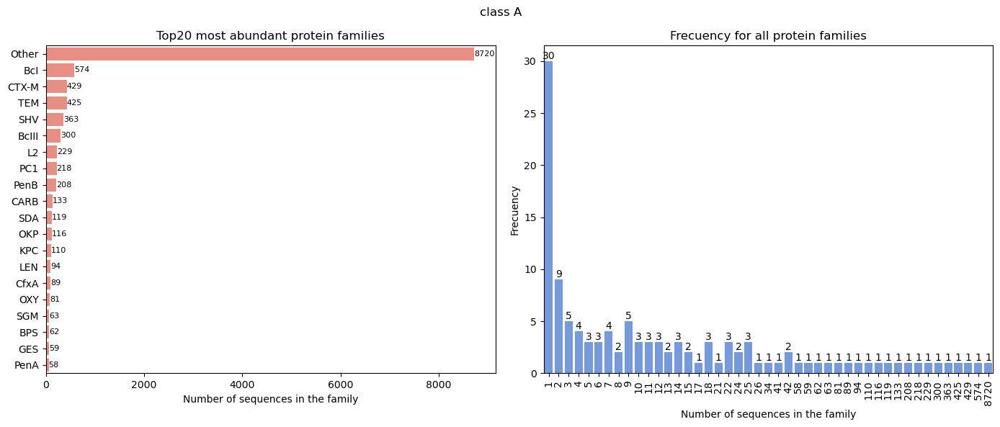

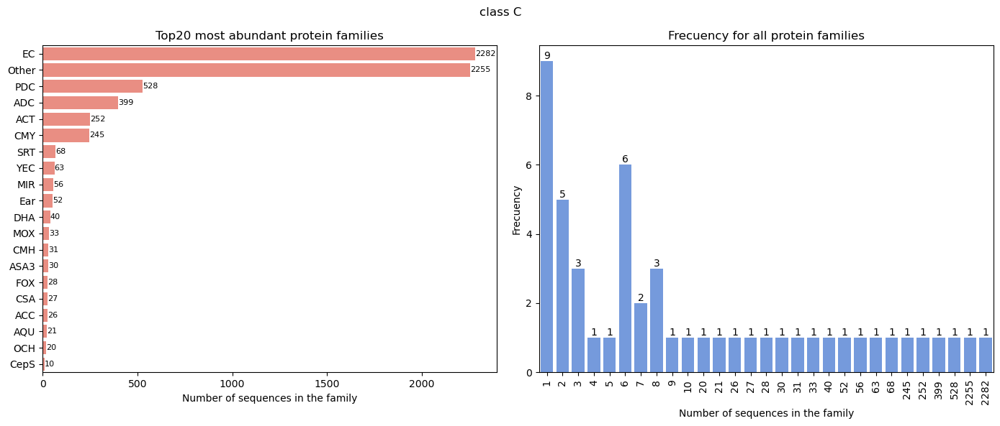

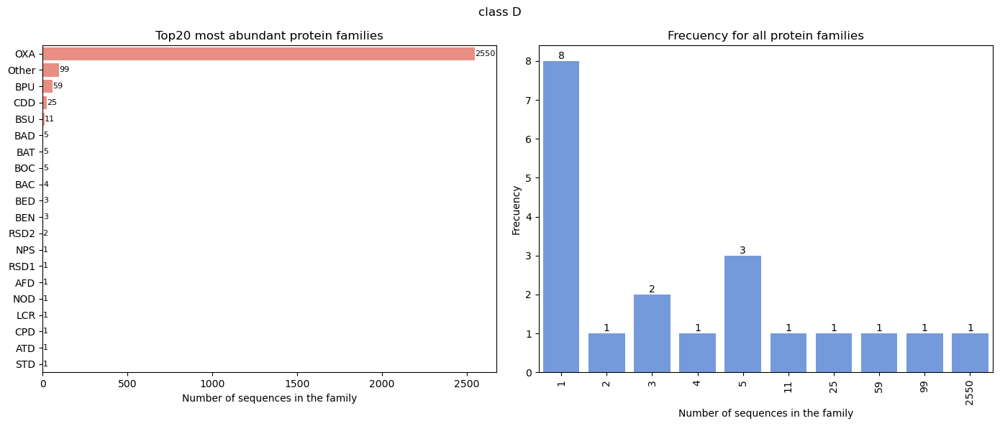

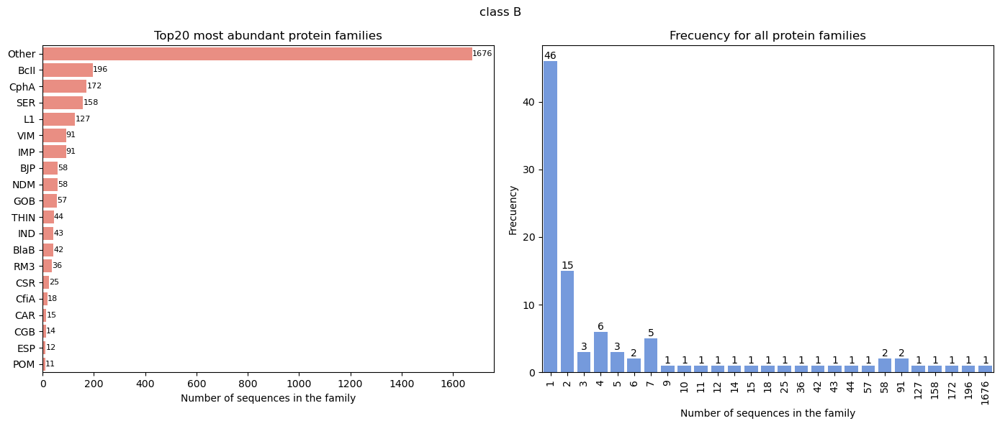

In [32]:
fam_count_plot(df_sbl_a, "class A")
fam_count_plot(df_sbl_c, "class C")
fam_count_plot(df_sbl_d, "class D")
fam_count_plot(df_mbl, "class B")

Text(0.5, 1.0, 'Class A')

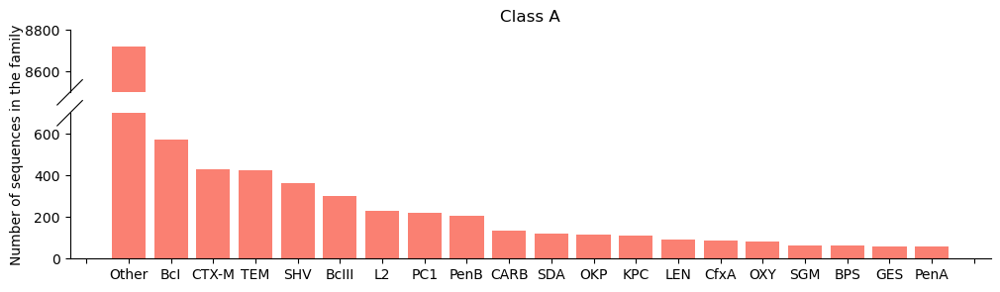

In [33]:
fams = df_sbl_a.groupby("protein_family_header").count().iloc[:,[0]]
fams = fams.reset_index()
fams = fams.rename(columns={"protein_family_header": "family", "tSNE1_esm1b":"number"})
fams = fams.sort_values("number", ascending=False)
top20 = fams.head(20)

plt.figure(figsize=(12,3))
bax = brokenaxes(ylims=((0, 700), (8500, 8800)), hspace=.2)
bax.bar(top20.family.to_list(), top20.number.to_list(), color='salmon')
bax.set_xticks(range(0,len(top20.number.to_list())))
bax.set_ylabel("Number of sequences in the family")
bax.set_title("Class A")

Text(0.5, 1.0, 'Class B')

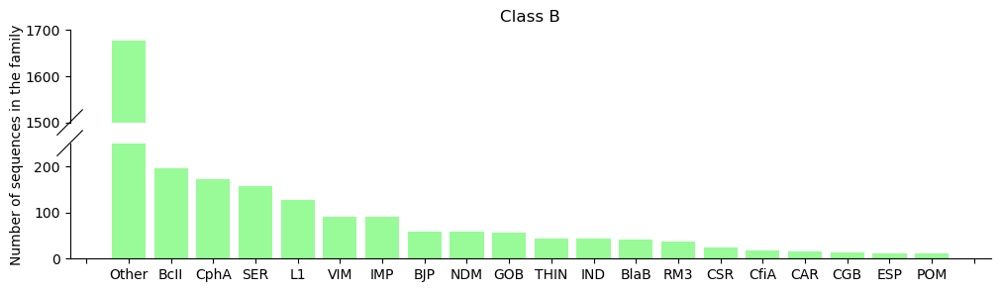

In [34]:
fams = df_mbl.groupby("protein_family_header").count().iloc[:,[0]]
fams = fams.reset_index()
fams = fams.rename(columns={"protein_family_header": "family", "tSNE1_esm1b":"number"})
fams = fams.sort_values("number", ascending=False)
top20 = fams.head(20)

plt.figure(figsize=(12,3))
bax = brokenaxes(ylims=((0, 250), (1500, 1700)), hspace=.2)
bax.bar(top20.family.to_list(), top20.number.to_list(), color='palegreen')
bax.set_xticks(range(0,len(top20.number.to_list())))
bax.set_ylabel("Number of sequences in the family")
bax.set_title("Class B")

Text(0.5, 1.0, 'Class C')

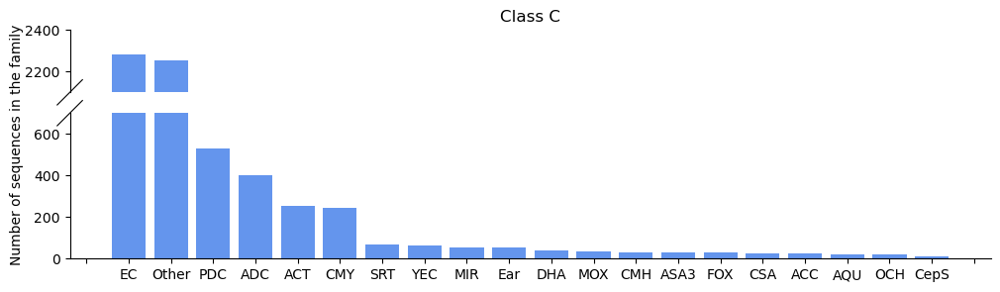

In [35]:
fams = df_sbl_c.groupby("protein_family_header").count().iloc[:,[0]]
fams = fams.reset_index()
fams = fams.rename(columns={"protein_family_header": "family", "tSNE1_esm1b":"number"})
fams = fams.sort_values("number", ascending=False)
top20 = fams.head(20)

plt.figure(figsize=(12,3))
bax = brokenaxes(ylims=((0, 700), (2100, 2400)), hspace=.2)
bax.bar(top20.family.to_list(), top20.number.to_list(), color='cornflowerblue')
bax.set_xticks(range(0,len(top20.number.to_list())))
bax.set_ylabel("Number of sequences in the family")
bax.set_title("Class C")

Text(0.5, 1.0, 'Class D')

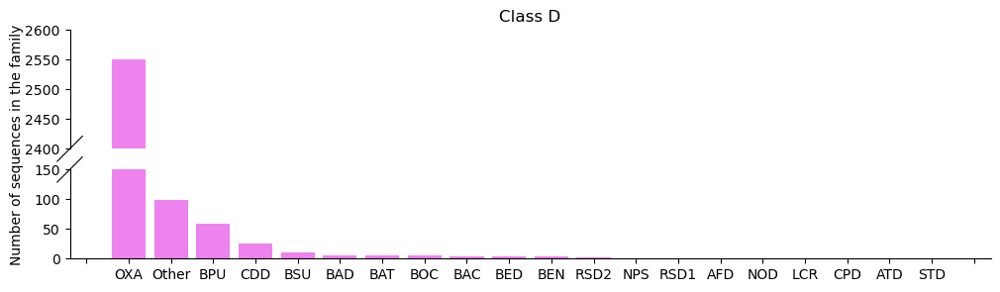

In [36]:
fams = df_sbl_d.groupby("protein_family_header").count().iloc[:,[0]]
fams = fams.reset_index()
fams = fams.rename(columns={"protein_family_header": "family", "tSNE1_esm1b":"number"})
fams = fams.sort_values("number", ascending=False)
top20 = fams.head(20)

plt.figure(figsize=(12,3))
bax = brokenaxes(ylims=((0, 150), (2400, 2600)), hspace=.2)
bax.bar(top20.family.to_list(), top20.number.to_list(), color='violet')
bax.set_xticks(range(0,len(top20.number.to_list())))
bax.set_ylabel("Number of sequences in the family")
bax.set_title("Class D")

In [37]:
# do a copy of dfs
df_a2 = df_sbl_a.copy()
df_a2 = df_a2.reset_index(drop=True)

df_b2 = df_mbl.copy()
df_b2 = df_b2.reset_index(drop=True)

df_c2 = df_sbl_c.copy()
df_c2 = df_c2.reset_index(drop=True)

df_d2 = df_sbl_d.copy()
df_d2 = df_d2.reset_index(drop=True)

# filter 10 most common fams
top18fam_a = list(df_a2["protein_family_header"].value_counts()[:19].index)
df_a2.loc[~df_a2["protein_family_header"].isin(top18fam_a), "protein_family_header"] = 'No in top 20'

top18fam_b = list(df_b2["protein_family_header"].value_counts()[:19].index)
df_b2.loc[~df_b2["protein_family_header"].isin(top18fam_b), "protein_family_header"] = 'No in top 20'

top18fam_c = list(df_c2["protein_family_header"].value_counts()[:19].index)
df_c2.loc[~df_c["protein_family_header"].isin(top18fam_c), "protein_family_header"] = 'No in top 20'

top18fam_d = list(df_d2["protein_family_header"].value_counts()[:18].index)
df_d2.loc[~df_d2["protein_family_header"].isin(top18fam_d), "protein_family_header"] = 'No in top 19'

In [38]:
# Define color palletes for bla_class
top20 = distinctipy.get_colors(20, pastel_factor=0.5) 
top20_2 = distinctipy.get_colors(20, pastel_factor=0.5) 
top20_3 = distinctipy.get_colors(19, pastel_factor=0.5) 

# change color of "other" and "no in top 20"category to light gray and dark gray
top20[0] = (0.90,0.90,0.90)
top20[1] = (0.75,0.75,0.75)

top20_2[1] = (0.90,0.90,0.90)
top20_2[6] = (0.75,0.75,0.75)

top20_3[1] = (0.90,0.90,0.90)
top20_3[18] = (0.75,0.75,0.75)

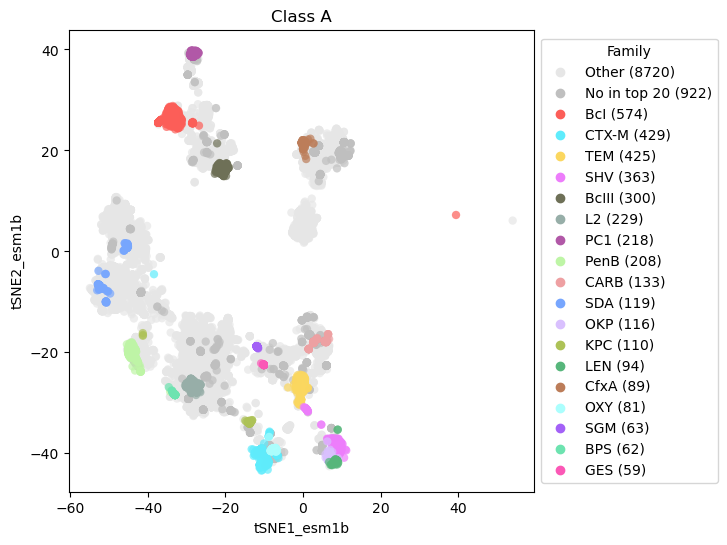

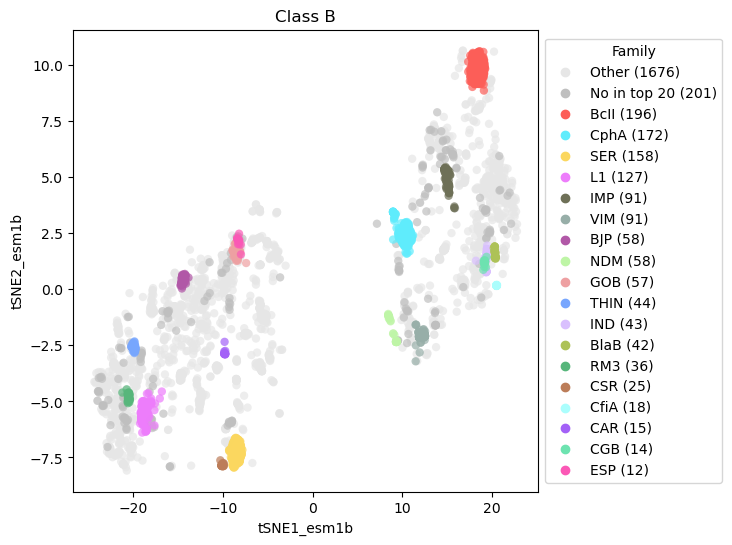

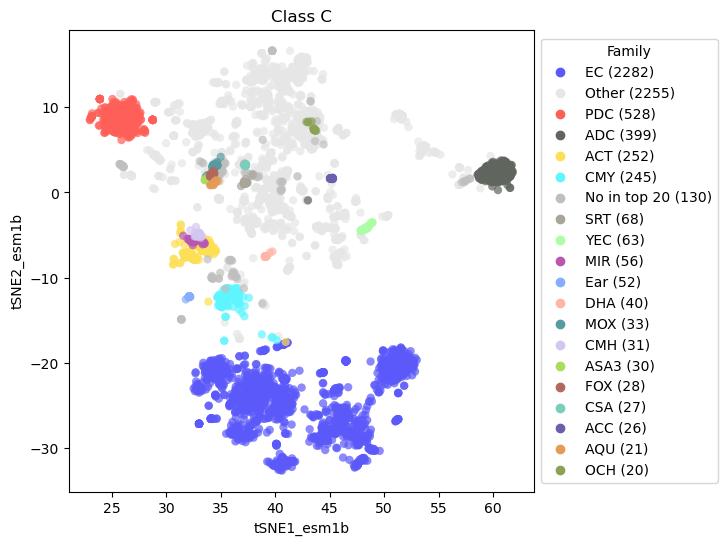

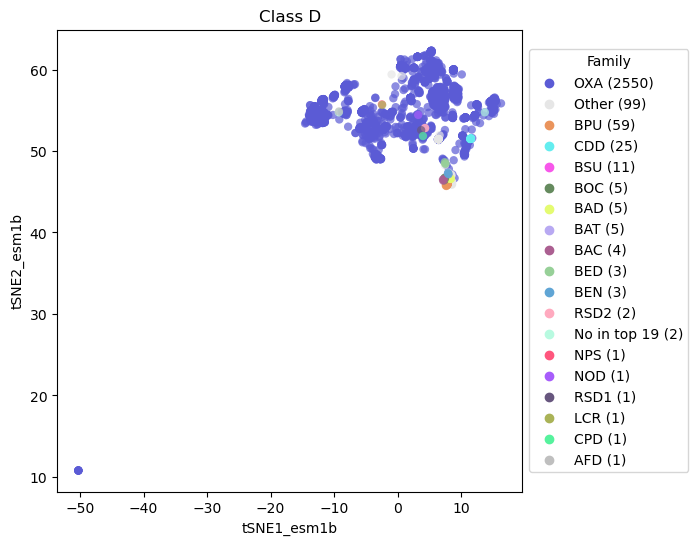

In [39]:
# do again the plots 
do_scatter_plt(df_a2, "Class A", top20, 1)
do_scatter_plt(df_b2, "Class B", top20, 1)
do_scatter_plt(df_c2, "Class C", top20_2, 1)
do_scatter_plt(df_d2, "Class D", top20_3, 1)

In [40]:
do_iscatter(df_a2,  "protein_family_header")

## barplots

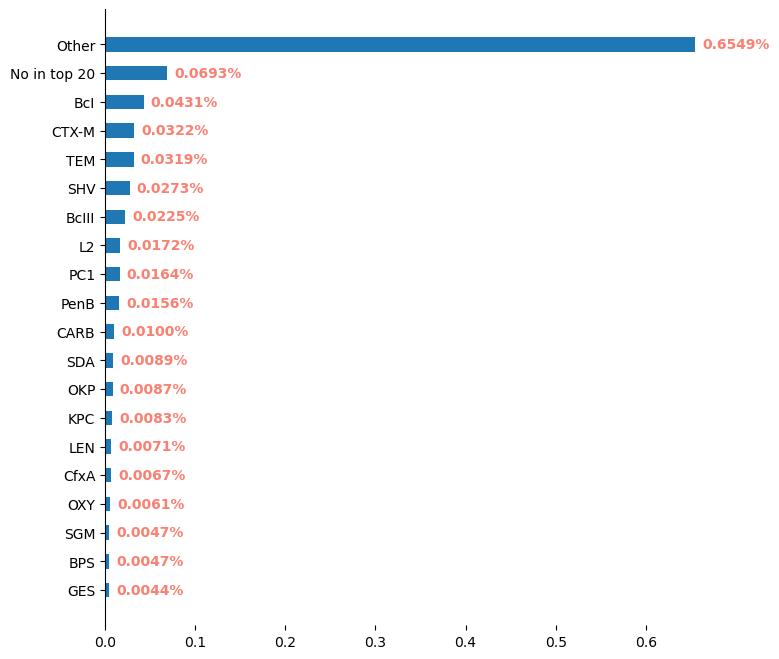

In [41]:
df_a2_fams = df_a2['protein_family_header'].value_counts(normalize=True).reset_index()
df_a2_fams = df_a2_fams.rename(columns = {"index":"name", "protein_family_header":"counts"})
df_a2_fams = df_a2_fams.sort_values(by='counts', ascending = True)

fig, ax = plt.subplots(figsize=(8,8))
bars = plt.barh(df_a2_fams['name'], df_a2_fams['counts'], height=0.5)
ax.spines[['right', 'top', 'bottom']].set_visible(False) 
#ax.xaxis.set_visible(False)
ax.bar_label(bars, padding=5, color='salmon', 
             fontsize=10, label_type='edge', fmt='%.4f%%',
            fontweight='bold')
plt.show()

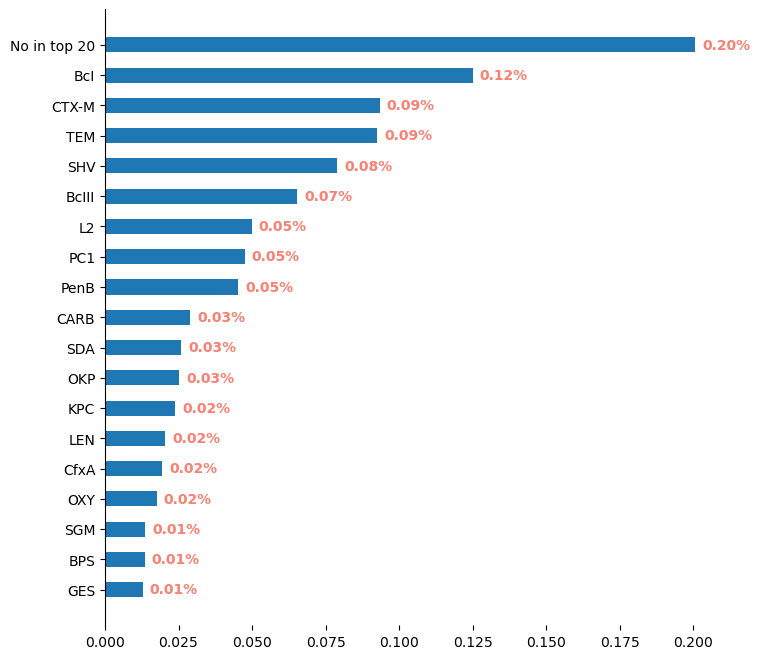

In [42]:
df_a2_fams = df_a2.copy()
df_a2_fams = df_a2_fams.drop(df_a2_fams.loc[df_a2_fams['protein_family_header'] == 'Other'].index)
df_a2_fams = df_a2_fams['protein_family_header'].value_counts(normalize=True).reset_index()
df_a2_fams = df_a2_fams.rename(columns = {"index":"name", "protein_family_header":"counts"})
df_a2_fams = df_a2_fams.sort_values(by='counts', ascending = True)

fig, ax = plt.subplots(figsize=(8,8))
bars = plt.barh(df_a2_fams['name'], df_a2_fams['counts'], height=0.5)
ax.spines[['right', 'top', 'bottom']].set_visible(False) 
#ax.xaxis.set_visible(False)
ax.bar_label(bars, padding=5, color='salmon', 
             fontsize=10, label_type='edge', fmt='%.2f%%',
            fontweight='bold')
plt.show()

fin